# **Analysing Crime Patterns in Montgomery County, USA: An Inclusive Study Based on NIBRS Data (2016-2022)**

---




In [1]:
# Importing all the necessary libraries.
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Saving the data from csv file in df dataframe.
df=pd.read_csv("/content/Crime_Dataset_Coursework1.csv")

<ipython-input-2-1e6b54624456>:2: DtypeWarning: Columns (1,18) have mixed types. Specify dtype option on import or set low_memory=False.
  df=pd.read_csv("/content/Crime_Dataset_Coursework1.csv")


In [3]:
# To find the exact number of rows and columns, df.shape gives result in the form of (rows,columns)
df.shape

(306094, 30)

In [17]:
df.head()

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Latitude,Longitude,Police District Number,Location,Date,time,AM/PM,year,month,offence
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,39.177744,-77.265619,5D,"(39.1777, -77.2656)",08/23/2018,09:52:00,PM,2018,8,Group A
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,38.992693,-77.097063,2D,"(38.9927, -77.0971)",03/30/2018,01:01:00,AM,2018,3,Group A
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,38.992693,-77.097063,2D,"(38.9927, -77.0971)",03/30/2018,01:01:00,AM,2018,3,Group A
3,201193163,3520,180029476,06/14/2018 10:26:45 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,39.147954,-77.218189,6D,"(39.148, -77.2182)",06/14/2018,10:26:00,PM,2018,6,Group A
4,201204355,2204,180043926,09/03/2018 12:06:54 PM,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,38.966174,-77.096561,2D,"(38.9662, -77.0966)",09/02/2018,11:30:00,PM,2018,9,Group A


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 306094 entries, 0 to 306093
Data columns (total 30 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   Incident ID             306094 non-null  int64  
 1   Offence Code            306094 non-null  object 
 2   CR Number               306094 non-null  int64  
 3   Dispatch Date / Time    257065 non-null  object 
 4   NIBRS Code              306094 non-null  object 
 5   Victims                 306094 non-null  int64  
 6   Crime Name1             305822 non-null  object 
 7   Crime Name2             305822 non-null  object 
 8   Crime Name3             305822 non-null  object 
 9   Police District Name    306000 non-null  object 
 10  Block Address           279888 non-null  object 
 11  City                    304818 non-null  object 
 12  State                   306094 non-null  object 
 13  Zip Code                302915 non-null  float64
 14  Agency              

In [5]:
# Percentage of null values for each column in given dataset.
x1=df.isnull().sum().reset_index()
x1['Percentage']=(x1[0]/306094)*100
x1

,index,0,Percentage
0,Incident ID,0,0.000000
1,Offence Code,0,0.000000
2,CR Number,0,0.000000
3,Dispatch Date / Time,49029,16.017629
4,NIBRS Code,0,0.000000
5,Victims,0,0.000000
6,Crime Name1,272,0.088862
7,Crime Name2,272,0.088862
8,Crime Name3,272,0.088862
9,Police District Name,94,0.030710


## Filling Missing Row and Columns

##**Offence group categorization based on NIBRS code**

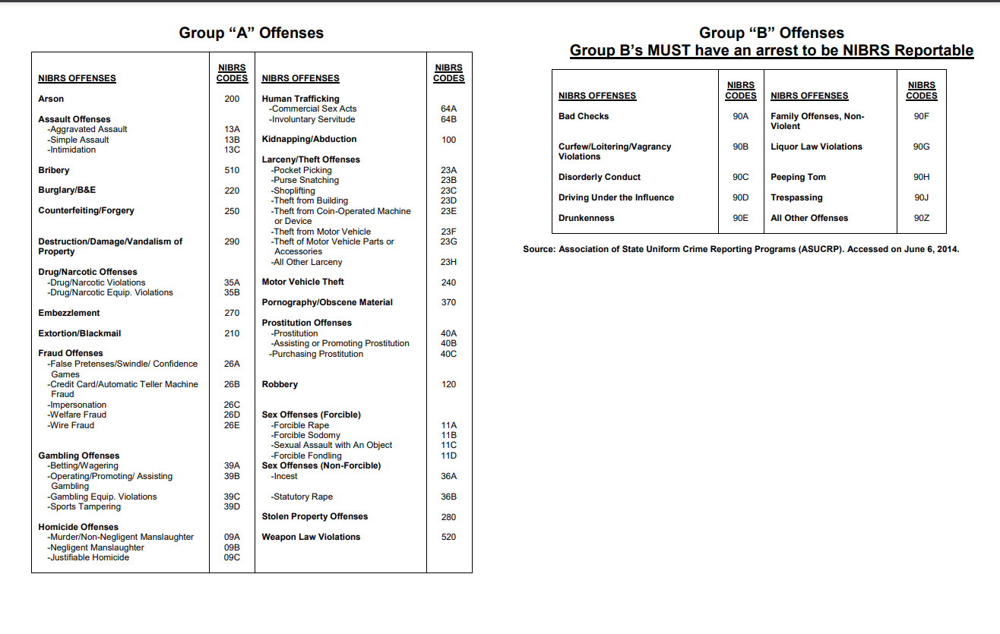

### Filling the missing values Crime Name1 with appropiate value.

In [6]:
# Filling the null values for crime name1 with help of Nibrs Code.
df['Crime Name1']=np.where(df['NIBRS Code']=='35A',df['Crime Name1'].fillna('Crime Against Society'),df['Crime Name1'])
df['Crime Name1']=np.where(df['NIBRS Code']=='90Z',df['Crime Name1'].fillna('Other'),df['Crime Name1'])
df['Crime Name1']=np.where(df['NIBRS Code']=='26G',df['Crime Name1'].fillna('Crime Against Property'),df['Crime Name1'])

### Filling the missing values Crime Name2 with appropiate value.

In [7]:
# Filling the null values for crime name2 with help of Nibrs Code.
df['Crime Name2']=np.where(df['NIBRS Code']=='35A',df['Crime Name2'].fillna('Drug/Narcotic Violations'),df['Crime Name2'])
df['Crime Name2']=np.where(df['NIBRS Code']=='90Z',df['Crime Name2'].fillna('All Other offence'),df['Crime Name2'])
df['Crime Name2']=np.where(df['NIBRS Code']=='26G',df['Crime Name2'].fillna('Fraud/Hacking computer invasion'),df['Crime Name2'])

### Filling the missing values Crime Name3 with appropiate value.

In [8]:
# Filling the null values for crime name3 with help of Nibrs Code.
df['Crime Name3']=np.where(df['NIBRS Code']=='35A',df['Crime Name3'].fillna('Drug/Narcotic Posses'),df['Crime Name3'])
df['Crime Name3']=np.where(df['NIBRS Code']=='26G',df['Crime Name3'].fillna('Fraud/Hacking computer invasion'),df['Crime Name3'])

Crime name 1 and Crime name 2 has no values for the NIBRS codes ‘35A,’’90Z,’ and ‘26G,’ each with a total count of 272. These null values have been addressed through a filling process utilizing the provided dataset.

Subsequently, the column now appears to be non-null after completion. Additionally, Crime name 3 has been filled for the codes '35A' and '26G,' reducing the number of null values from 272 to only 68.

### Removing irregularity values from Police District Number

In [9]:
# Police District Number had few value which represent the same as other values.
def sorting(hop): # Creating the fuction name sorting with hop as variable.
    if '1.0D' in hop:
        number = '1D' # Replaceing the unfiltered values into specific value.
        return number
    elif '8.0D' in hop:
        number= '8D'
        return number
    elif '6.0D' in hop:
        number= '6D'
        return number
    elif '3.0D' in hop:
        number= '3D'
        return number
    elif '4.0D' in hop:
        number= '4D'
        return number
    elif '5.0D' in hop:
        number= '5D'
        return number
    else:
        return(hop)

# Executing the function using df.apply() and saving the result in same column.
df['Police District Number'] = df['Police District Number'].apply(sorting)

# Dropping the 'other' values from Police district number.
df.drop(df[df['Police District Number'] =='OTHER'].index, inplace = True)

### Filling the missing null values for Police District Name

In [10]:
# With help of Police District Number, filling the null values for police district name using numpy.where() function and sorting the result in orignal column.
df['Police District Name']=np.where(df['Police District Number']=='1D',df['Police District Name'].fillna('ROCKVILLE'),df['Police District Name'])
df['Police District Name']=np.where(df['Police District Number']=='3D',df['Police District Name'].fillna('SILVER SPRING'),df['Police District Name'])
df['Police District Name']=np.where(df['Police District Number']=='4D',df['Police District Name'].fillna('WHEATON'),df['Police District Name'])
df['Police District Name']=np.where(df['Police District Number']=='5D',df['Police District Name'].fillna('GERMANTOWN'),df['Police District Name'])
df['Police District Name']=np.where(df['Police District Number']=='6D',df['Police District Name'].fillna('MONTGOMERY VILLAGE'),df['Police District Name'])
df['Police District Name']=np.where(df['Police District Number']=='8D',df['Police District Name'].fillna('CITY OF TAKOMA PARK'),df['Police District Name'])


In [11]:
# Filtering out the irregularity from Police District Name, using a fuction naming
# As City of Takoma park is same as Takoma part
def naming(city):
    if 'CITY OF TAKOMA PARK' in city:
        return 'TAKOMA PARK'
    else:
        return(city)

# Appliying the fuction naming using df.apply()
df['Police District Name'] = df['Police District Name'].apply(naming)

### Filling the missing value for Cities.

In [12]:
# Filling city name approximately with the help of police district name as the trend denotes for many cities is same as police district name.
df['City']=np.where(df['Police District Name']=='SILVER SPRING',df['City'].fillna('SILVER SPRING'),df['City'])
df['City']=np.where(df['Police District Name']=='ROCKVILLE',df['City'].fillna('ROCKVILLE'),df['City'])
df['City']=np.where(df['Police District Name']=='TAKOMA PARK',df['City'].fillna('TAKOMA PARK'),df['City'])

In [13]:
# Filtering out the irregularity from the names of city, using a fuction called naming.
# As few irregularity points toward the same city only.
# Hence filtering out those irregularity with if and else condition.
def naming(city):
    if 'ROCKVILLLE' in city:
        return 'ROCKVILLE'
    elif 'ROCKVIILE' in city :
        return 'ROCKVILLE'
    elif 'SILVERS SPRING' in city:
        return 'SILVER SPRING'
    elif 'BETHEDA' in city:
        return 'BETHESDA'
    elif 'GAIHTERSBURG' in city:
        return 'GAITHERSBURG'
    elif 'GAITHERSBUG' in city:
        return 'GAITHERSBURG'
    elif 'CLAEKSBURG' in city:
        return 'CLARKSBURG'
    elif 'GAITHERSBUG' in city:
        return 'GAITHERSBURG'
    elif 'MT AIRY' in city:
        return 'MOUNT AIRY'
    else:
        return(city)

# Appliying the fuction naming using df.apply()
df['City'] = df['City'].apply(naming)

# Dropping few irregularities from the dataset and cementing the change using inplace as 'True'.
df.drop(df[df['City'] =='0'].index, inplace = True)

### New percentage of null values after filtering out possible null values.

In [14]:
x2=df.isnull().sum().reset_index()
x2['Percentage']=(x2[0]/305847)*100
x2

,index,0,Percentage
0,Incident ID,0,0.000000
1,Offence Code,0,0.000000
2,CR Number,0,0.000000
3,Dispatch Date / Time,49010,16.024352
4,NIBRS Code,0,0.000000
5,Victims,0,0.000000
6,Crime Name1,0,0.000000
7,Crime Name2,0,0.000000
8,Crime Name3,68,0.022233
9,Police District Name,0,0.000000


### Sperating Date, month and year

In [15]:
# Sperating the Date, month and year from Start date time using str.split() function.
df[['Date', 'time','AM/PM']] = df['Start_Date_Time'].str.split(' ', expand=True)
df['year'] = pd.to_datetime(df['Start_Date_Time']).dt.year # Extracting only the year from start date.
df['month'] = pd.to_datetime(df['Start_Date_Time']).dt.month # Extracting only the month from start date.

<ipython-input-15-7ba7408314bc>:3: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['year'] = pd.to_datetime(df['Start_Date_Time']).dt.year # Extracting only the year from start date.
<ipython-input-15-7ba7408314bc>:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df['month'] = pd.to_datetime(df['Start_Date_Time']).dt.month # Extracting only the month from start date.


### Grouping offence

In [16]:
# Grouping Crime into offence of Group A or Group B.
df['offence']=np.where((df['NIBRS Code']=='90Z') | (df['NIBRS Code']=='90A') | (df['NIBRS Code']=='90B') |
                       (df['NIBRS Code']=='90D') | (df['NIBRS Code']=='90H') | (df['NIBRS Code']=='90E') |
                       (df['NIBRS Code']=='90I') | (df['NIBRS Code']=='90F') | (df['NIBRS Code']=='90G') |
                       (df['NIBRS Code']=='90C') | (df['NIBRS Code']=='90J'),'Group B','Group A')

### Sperating month according to season

In [18]:
#Sorting month according to the season.
df['season']=np.where((df['month']>=1) & (df['month']<=2),'Winter',
                    ((np.where((df['month']>=3) & (df['month']<=5),'Spring',
                              (np.where((df['month']>=6) & (df['month']<=7),'Summer',
                                        (np.where((df['month']>=8) & (df['month']<=11),'Fall','Winter'))))))))

## **Descriptive Analysis**

In [19]:
# Getting the count of Group A and Group B crime happenning in Montgomery County.
df['offence'].value_counts()

,count
offence,
Group A,197936
Group B,107911


In [20]:
df['Crime Name1'].value_counts()

,count
Crime Name1,
Crime Against Property,139923
Crime Against Society,68944
Other,63165
Crime Against Person,30242
Not a Crime,3573


In [21]:
df['Crime Name2'].value_counts()

,count
Crime Name2,
All Other Offenses,72316
Theft From Motor Vehicle,26261
Drug/Narcotic Violations,23289
Simple Assault,21043
Destruction/Damage/Vandalism of Property,18975
...,...
Welfare Fraud,11
Negligent Manslaughter,2
"Human Trafficking, Involuntary Servitude",2


In [22]:
df['Police District Name'].value_counts()

,count
Police District Name,
SILVER SPRING,64394
WHEATON,57569
MONTGOMERY VILLAGE,52540
BETHESDA,42777
ROCKVILLE,41536
GERMANTOWN,39257
TAKOMA PARK,7774


In [23]:
df['season'].value_counts()

,count
season,
Fall,104340
Spring,74620
Winter,73137
Summer,53750


In [24]:
df['AM/PM'].value_counts()

,count
AM/PM,
PM,199358
AM,106489


Crime at night is more likely to happen than during day.

## **Data Visualization**

### How the offence are categorized in montgomery county based on NIBRS code?

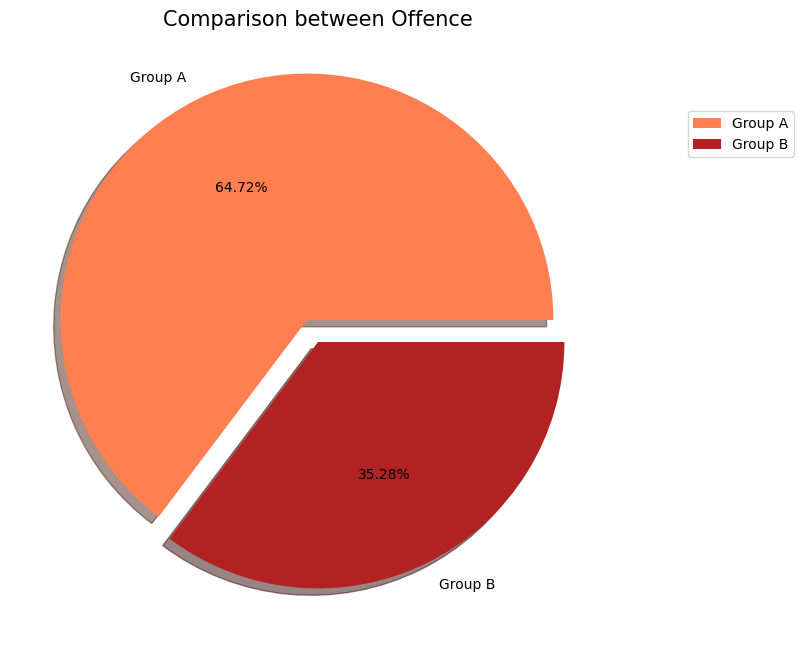

In [30]:
# Plotting a pie chart for Offence
plt.figure(figsize=(12,8),dpi=100)
size=df['offence'].value_counts()
color='Coral','firebrick'
labels='Group A','Group B'
explode=[0.1,0]
plt.pie(size,colors=color,labels=labels,explode=explode,autopct='%.2f%%',shadow=True)
plt.title('Comparison between Offence',fontsize=15,color='black')
plt.legend(loc=(1.1,0.8))

Pie chart clearly shows the percentage of offence in each group and Group ‘A’ offence is predominant with 64.72% in the given period.

Text(0, 0.5, 'Counts')

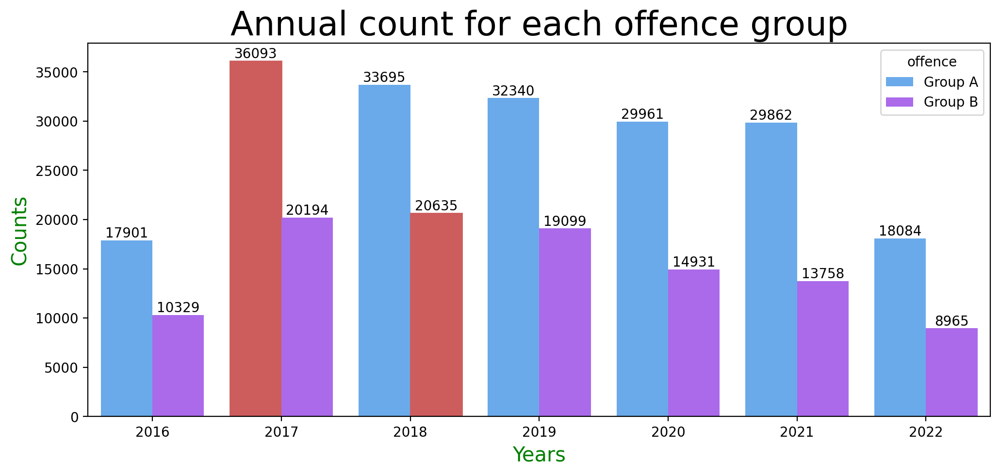

In [32]:
plt.figure(figsize=(12,5),dpi=200)
cx=sns.countplot(data=df,x='year',hue='offence',palette='cool')
# Bar_label to give exact value of each bar plot.
for bars in cx.containers:
    cx.bar_label(bars)
for bar in cx.patches:
    if bar.get_height() > 36000:
        bar.set_color('indianred')
for bar in cx.patches:
    if bar.get_height() == 20635:
        bar.set_color('indianred')
plt.title('Annual count for each offence group',fontsize=25,color='black')
plt.xlabel('Years',fontsize=15,color='green')
plt.ylabel('Counts',fontsize=15,color='green')

Group A offenses were most prevalent in 2017, while Group B offenses took the lead in 2018. Notably, in the latest year, 2022, occurrences in both groups have significantly decreased, indicating a positive trend for public safety.

### Most happening crime in Montgomery County

Text(0, 0.5, 'Longitude')

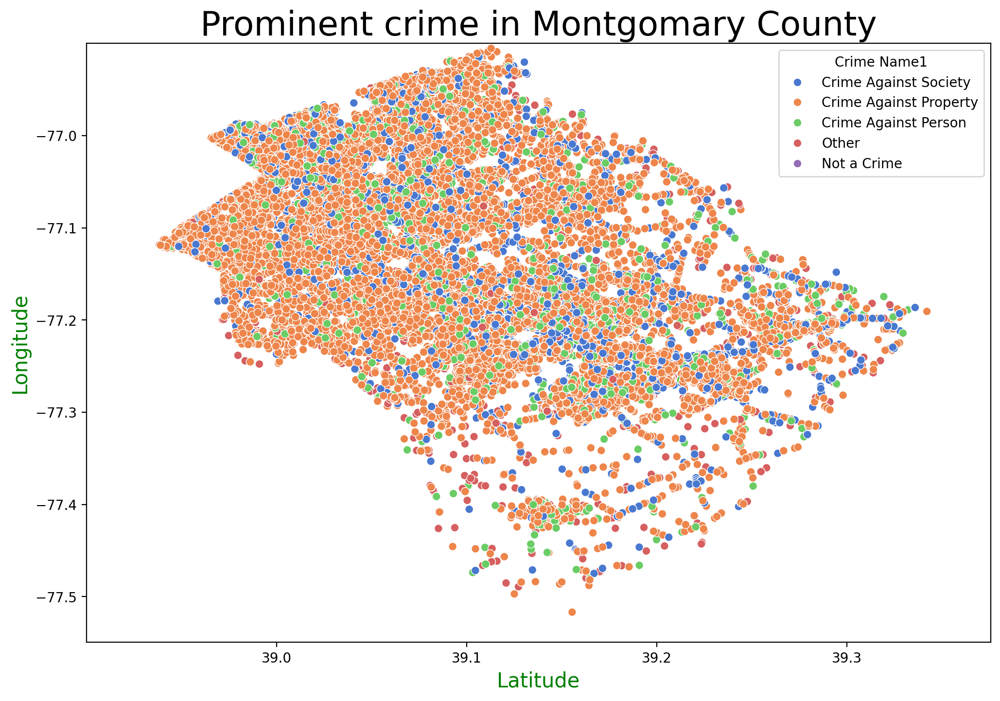

In [44]:
plt.figure(figsize=(12,8),dpi=200)
sns.scatterplot(data=df,x='Latitude',y='Longitude',hue='Crime Name1',palette='muted')
plt.xlim(38.90003,39.375527)# Limiting x axis between given value.
plt.ylim(-77.549547,-76.900099)# Limiting y axis between given value.
plt.title('Prominent crime in Montgomary County',fontsize=25,color='black')
plt.xlabel('Latitude',fontsize=15,color='green')
plt.ylabel('Longitude',fontsize=15,color='green')

Text(0, 0.5, 'Name of crime')

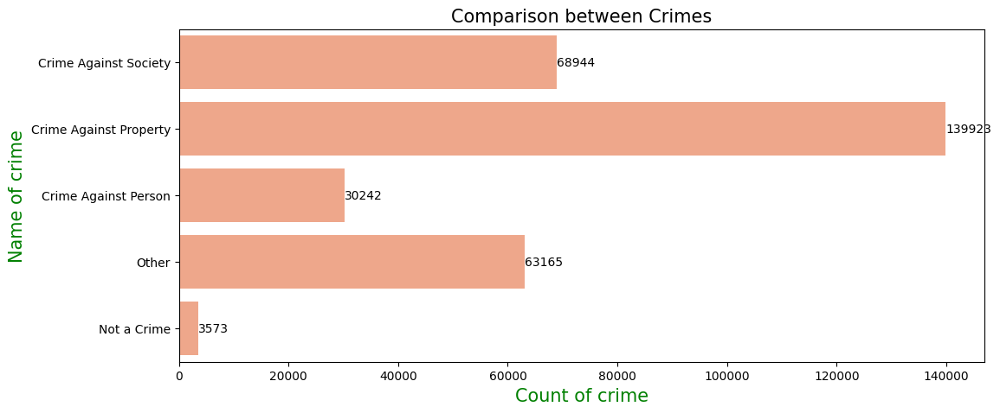

In [35]:
plt.figure(figsize=(12,5),dpi=100)
ax=sns.countplot(data=df,y='Crime Name1',color='lightsalmon')
# Bar_label to give exact value of each bar plot.
for bars in ax.containers:
    ax.bar_label(bars)
plt.title('Comparison between Crimes',fontsize=15,color='black')
plt.xlabel('Count of crime',fontsize=15,color='green')
plt.ylabel('Name of crime',fontsize=15,color='green')

From the visualisations, it is evident that Crime against property is the most prominent and Crime against society takes the second highest in the Montgomery County.

### Crime rate trend in the given 5 years

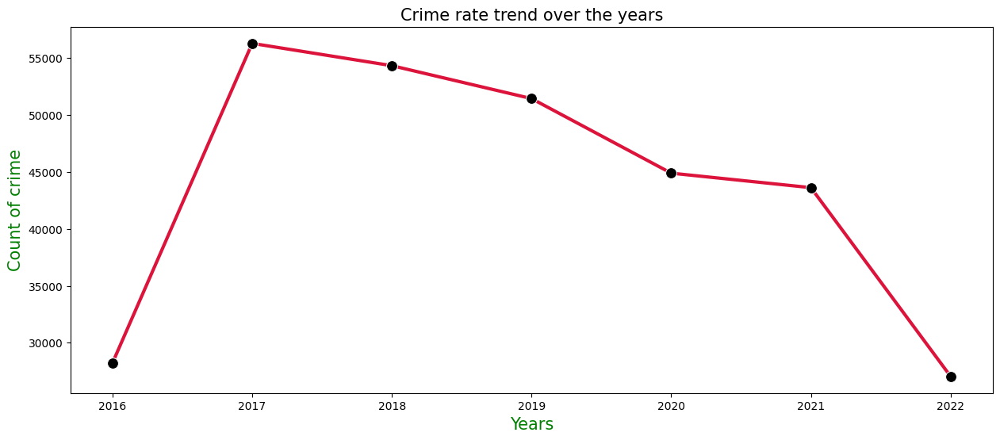

In [37]:
# Copying main data frame into new database
df1=df.copy()

# Converting dtype of object column into category.
df1['State']=df1['State'].astype('category')
df1['City']=df1['City'].astype('category')
df1['Crime Name1']=df1['Crime Name1'].astype('category')
df1['NIBRS Code']=df1['NIBRS Code'].astype('category')
df1['Police District Name']=df1['Police District Name'].astype('category')
df1['Crime Name2']=df1['Crime Name2'].astype('category')
df1['Crime Name3']=df1['Crime Name3'].astype('category')

# Specifing numrical values for every unique categorical value.
df1['State_numeric']=df1['State'].cat.codes
df1['City_numeric']=df1['City'].cat.codes
df1['Crime Name1_numeric']=df1['Crime Name1'].cat.codes
df1['NIBRS Code_numeric']=df1['NIBRS Code'].cat.codes
df1['Police District Name_numeric']=df1['Police District Name'].cat.codes
df1['Crime Name2_numeric']=df1['Crime Name2'].cat.codes
df1['Crime Name3_numeric']=df1['Crime Name3'].cat.codes

plt.figure(figsize=(15,6),dpi=100)
# Grouping offence with Nibrs code numeric.
p5=df1.groupby(['year'])["NIBRS Code_numeric"].count().reset_index()
sns.lineplot(data=p5,x='year',y='NIBRS Code_numeric',lw=3,marker='o',ms=10,mfc='black',color='Crimson')
plt.title('Crime rate trend over the years',fontsize=15,color='black')
plt.xlabel('Years',fontsize='15',color='green')
plt.ylabel('Count of crime',fontsize=15,color='green')
plt.show()

The graph concludes that the crime rate follows the decreasing trend, which shows the positive sign and police agency is already on track.

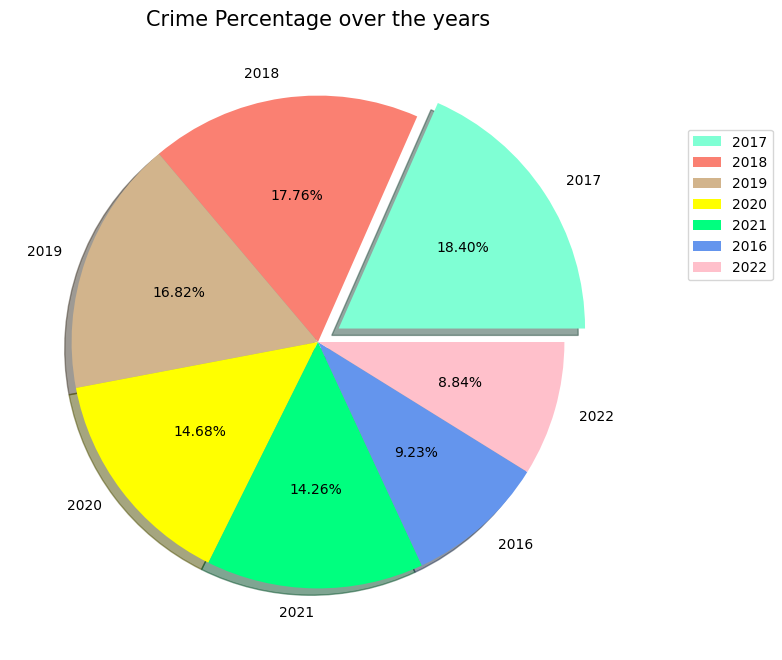

In [49]:
plt.figure(figsize=(12,8),dpi=100)
size=df['year'].value_counts()
color='aquamarine','salmon','tan','yellow','springgreen','cornflowerblue','pink'
labels='2017','2018','2019','2020','2021','2016','2022'
explode=[0.1,0,0,0,0,0,0]
plt.pie(size,colors=color,labels=labels,explode=explode,autopct='%.2f%%',shadow=True)
plt.title('Crime Percentage over the years',fontsize=15,color='black')
plt.legend(loc=(1.1,0.6))
plt.show()

Percentage of crime occurring for each year has also been displayed in the below pie chart. It explains the crime rate is decreasing over period with 14.26% and 8.84% for last 2 years.

### City with the highest crime rate

<ipython-input-47-2a904a7f4e5e>:4: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  p2=xv.groupby(['offence','City'])['Crime Name1_numeric'].count().reset_index()


(-2.35, 49.35, -301.5, 6331.5)

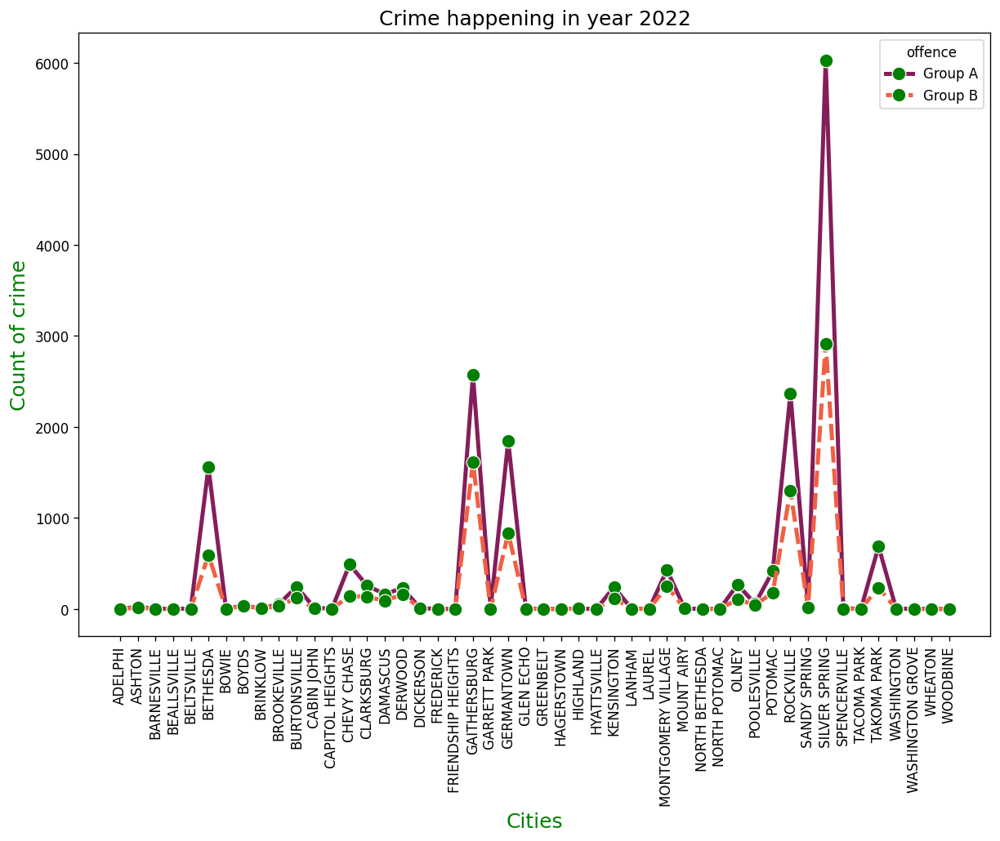

In [47]:
# Extracting data for only year 2022.
xv=df1[df1['year']==2022.0]

p2=xv.groupby(['offence','City'])['Crime Name1_numeric'].count().reset_index()

plt.figure(figsize=(12,8),dpi=120)
sns.lineplot(data=p2,x='City',y='Crime Name1_numeric',hue='offence',style='offence',lw=3,marker='o',ls='dashdot',ms=10,mfc='green',palette='rocket')
plt.xticks(rotation=90)
plt.title('Crime happening in year 2022',fontsize=15,color='black')
plt.xlabel('Cities',fontsize=15,color='green')
plt.ylabel('Count of crime',fontsize=15,color='green')
plt.axis()

Line plot clearly shows ‘SILVERSPRING’ as the highly affected city in 2022 for both Group ‘A’ and ‘B’ offences.

### Busiest police agency throughout the given period

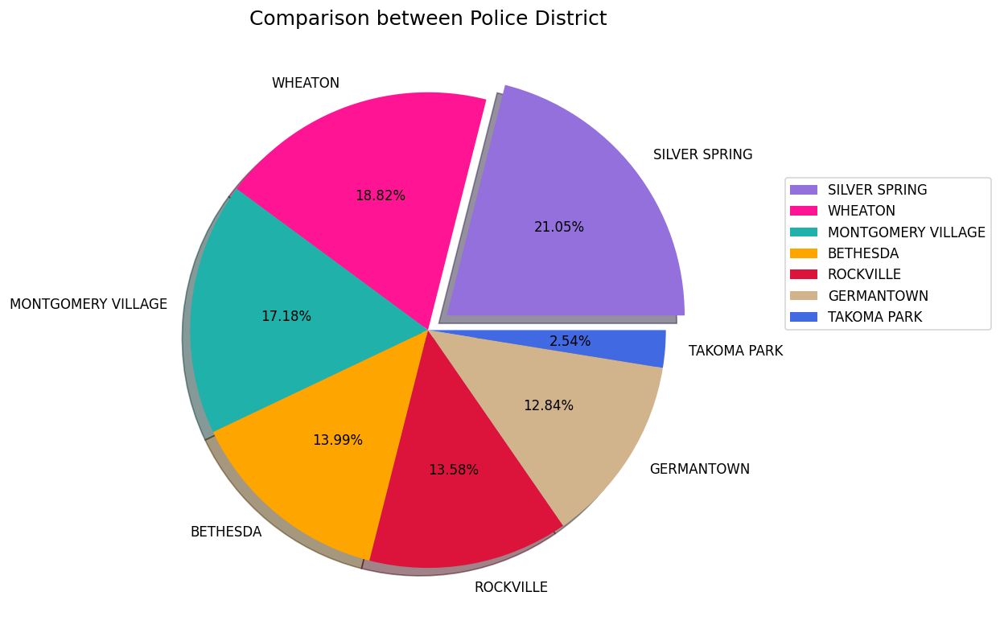

In [54]:
plt.figure(figsize=(12,8),dpi=120)
size=df['Police District Name'].value_counts()
color='mediumpurple','deeppink','lightseagreen','orange','crimson','tan','royalblue'
labels='SILVER SPRING','WHEATON','MONTGOMERY VILLAGE','BETHESDA','ROCKVILLE','GERMANTOWN','TAKOMA PARK'
explode=[0.1,0,0,0,0,0,0]

plt.pie(size,colors=color,labels=labels,explode=explode,autopct='%.2f%%',shadow=True)
plt.title('Comparison between Police District',fontsize=15,color='black')
plt.legend(loc=(1.1,0.5))

Monitoring police agency activity provides the clarity on which district is busiest throughout the given year. Below Pie-chart clearly shows Silverspring police agencies works with higher efficiency with 21.05% and it’s the crime hub too

Text(0, 0.5, 'Longitude')

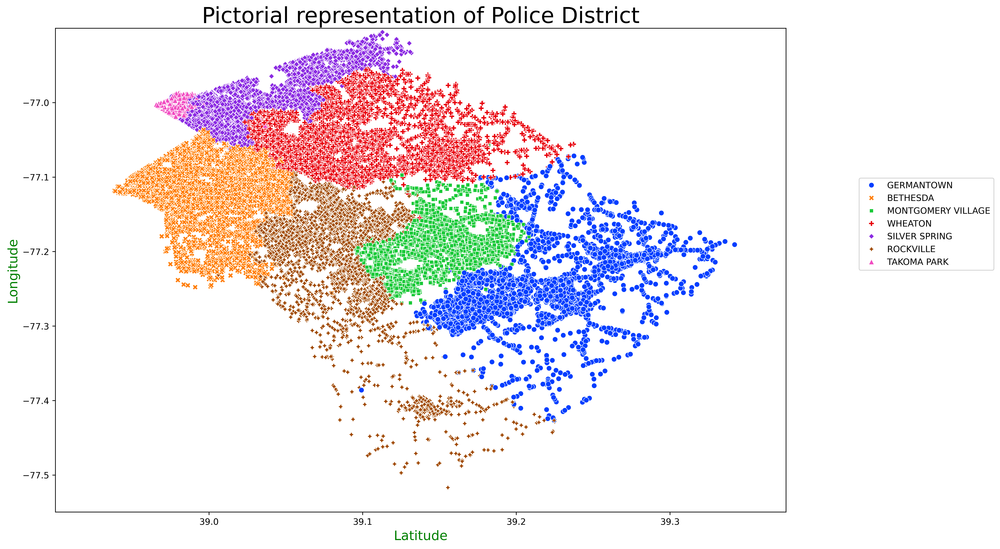

In [70]:
plt.figure(figsize=(15,10),dpi=500)
sns.scatterplot(data=df,x='Latitude',y='Longitude',hue='Police District Name',style='Police District Name',palette='bright')
plt.xlim(38.90003,39.375527)# Limting x axis between given values.
plt.ylim(-77.549547,-76.900099)# Limting x axis between given values.
plt.title('Pictorial representation of Police District',fontsize=25,color='black')
plt.legend(loc=(1.1,0.5)) # Specifing location of Legend.
plt.xlabel('Latitude',fontsize=15,color='green')
plt.ylabel('Longitude',fontsize=15,color='green')

### Victims affected at different places and different time

In [56]:
df2=df.copy()
df2['Place_Lower'] = df2['Place'].str.lower() # converts string to lower case

# Define the mapping of substrings to values
substring_to_value = {
    'Terminal': 'Transit centre',
    'parking garage - metro': 'Transit centre',
    'parking lot - metro': 'Transit centre',
    'street - bus stop': 'Transit centre',
    'parking lot - commercial': 'Commercial',
    'commercial': 'Commercial',
    'convenience store': 'Commercial',
    'street - commercial': 'Commercial',
    'gas': 'Commercial',
    'auto': 'Commercial',
    'parking garage - commercial': 'Commercial',
    'industrial': 'Commercial',
    'construction': 'Construction zone',
    'cyberspace': 'Cyberspace',
    'retail': 'Retail',
    'grocery': 'Retail',
    'pawn shop': 'Retail',
    'laundromat': 'Retail',
    'government': 'Government Building',
    'parking garage - county': 'Government Building',
    'parking lot - county': 'Government Building',
    'jail': 'Government Building',
    'military': 'Government Building',
    'hotel': 'Dining and Lodging area',
    'restaurants': 'Dining and Lodging area',
    'street': 'Street',
    'residence': 'Residential',
    'parking garage - residential': 'Residential',
    'parking lot - residential': 'Residential',
    'street - residential': 'Residential',
    'bank': 'Bank',
    'atm': 'Bank',
    'bar': 'Bar',
    'liquor': 'Bar',
    'doctor': 'Healthcare',
    'hospital': 'Healthcare',
    'school': 'Educational hub',
    'daycare': 'Educational hub',
    'nursery': 'Educational hub',
    'parking lot - school': 'Educational hub',
    'church': 'Community center',
    'community': 'Community center',
    'parking lot - church': 'Community center'
}

# Create a function to apply the mapping
def map_substrings(text):
    for substring, value in substring_to_value.items():
        if substring in text:
            return value
    return 'Others'

# Apply the mapping function to create the new column
df2['Place_Category'] = df2['Place_Lower'].apply(lambda x: map_substrings(x))

# Display the updated DataFrame
df2

,Incident ID,Offence Code,CR Number,Dispatch Date / Time,NIBRS Code,Victims,Crime Name1,Crime Name2,Crime Name3,Police District Name,...,Location,Date,time,AM/PM,year,month,offence,season,Place_Lower,Place_Category
0,201202980,3550,180042096,08/23/2018 09:52:08 PM,35B,1,Crime Against Society,Drug Equipment Violations,DRUGS - NARCOTIC EQUIP - POSSESS,GERMANTOWN,...,"(39.1777, -77.2656)",08/23/2018,09:52:00,PM,2018,8,Group A,Fall,street - in vehicle,Street
1,201181293,3522,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - POSSESS,BETHESDA,...,"(38.9927, -77.0971)",03/30/2018,01:01:00,AM,2018,3,Group A,Spring,street - in vehicle,Street
2,201181293,3562,180015424,03/30/2018 01:00:55 AM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - MARIJUANA - POSSESS,BETHESDA,...,"(38.9927, -77.0971)",03/30/2018,01:01:00,AM,2018,3,Group A,Spring,street - in vehicle,Street
3,201193163,3520,180029476,06/14/2018 10:26:45 PM,35A,1,Crime Against Society,Drug/Narcotic Violations,DRUGS - OPIUM OR DERIVATIVE - SELL,MONTGOMERY VILLAGE,...,"(39.148, -77.2182)",06/14/2018,10:26:00,PM,2018,6,Group A,Summer,hotel/motel/etc.,Dining and Lodging area
4,201204355,2204,180043926,09/03/2018 12:06:54 PM,220,1,Crime Against Property,Burglary/Breaking and Entering,BURGLARY - NO FORCED ENTRY-RESIDENTIAL,BETHESDA,...,"(38.9662, -77.0966)",09/02/2018,11:30:00,PM,2018,9,Group A,Fall,residence - single family,Residential
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
306089,201320571,1399,210006666,02/21/2021 07:25:28 AM,13B,1,Crime Against Person,Simple Assault,ASSAULT - 2ND DEGREE,MONTGOMERY VILLAGE,...,"(39.1727, -77.1973)",02/20/2021,08:00:00,PM,2021,2,Group A,Winter,residence -townhouse/duplex,Residential
306090,201329875,2305,210017101,05/06/2021 10:54:47 PM,23F,1,Crime Against Property,Theft From Motor Vehicle,LARCENY - FROM AUTO,WHEATON,...,"(39.0597, -77.076)",05/06/2021,03:15:00,AM,2021,5,Group A,Spring,parking lot - residential,Residential
306091,201329751,5016,210016952,05/05/2021 10:38:58 PM,90Z,1,Crime Against Society,All Other Offenses,OBSTRUCT GOVT - VIOLATION OF A COURT ORDER,GERMANTOWN,...,"(39.1997, -77.273)",05/05/2021,10:38:00,PM,2021,5,Group B,Spring,residence - apartment/condo,Residential
306092,201323117,9099,210009468,03/13/2021 12:07:14 PM,90Z,1,Crime Against Society,All Other Offenses,ALL OTHER OFFENSES,SILVER SPRING,...,"(38.9858, -77.0229)",03/13/2021,01:35:00,PM,2021,3,Group B,Spring,street - other,Street


(-0.7000000000000001, 14.7, -3828.4500000000003, 81805.45)

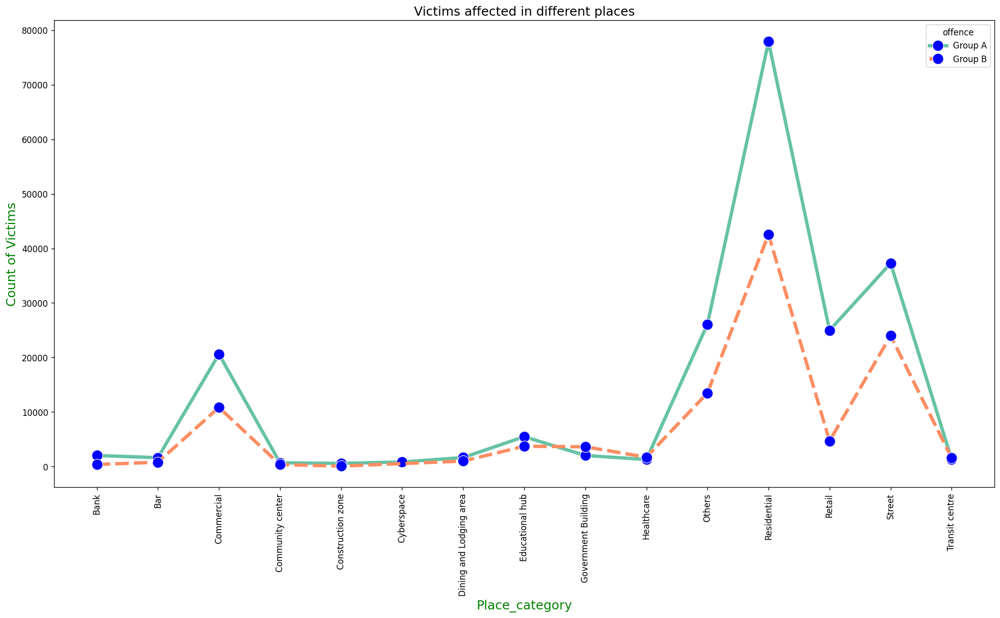

In [57]:
z1=df2.groupby(['Place_Category','offence'])['Victims'].sum().reset_index()
plt.figure(figsize=(20,10),dpi=120)
sns.lineplot(data=z1,x='Place_Category',y='Victims',hue='offence',style='offence',palette='Set2',lw=4,marker='o',ms=13,mfc='blue')
plt.xticks(rotation=90)
plt.title('Victims affected in different places',fontsize=15,color='black')
plt.xlabel('Place_category',fontsize=15,color='green')
plt.ylabel('Count of Victims',fontsize=15,color='green')
plt.axis()

Utilising the modified dataset, visualizing the number of victims across various categorized places considering the offence group.

Line chart makes it evident that the highest number of victims, approximately 78,000 and 42,000, has been impacted in residential areas for Group A and B, respectively. Moreover, in streets, commercial, and retail areas, Group A offenses also exhibit higher prevalence, with a victim count exceeding 20,000.

(38.93003, 39.345527, -77.549547, -76.900099)

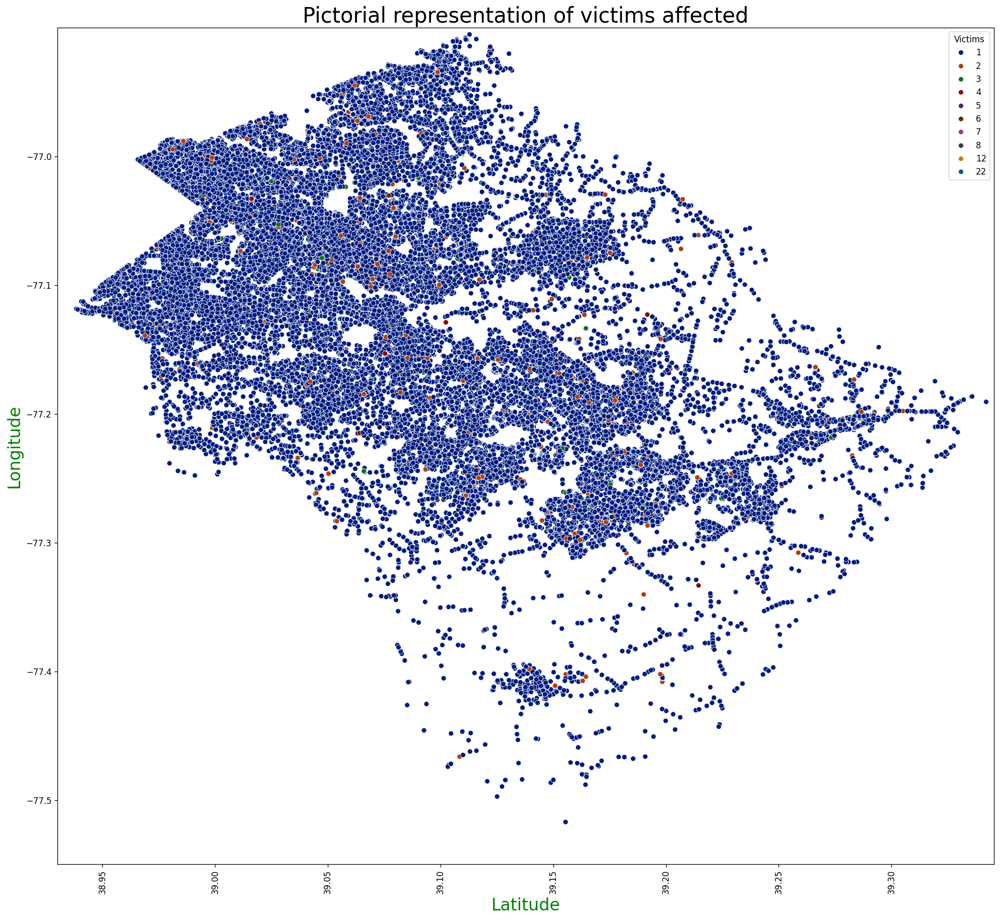

In [58]:
plt.figure(figsize=(20,18),dpi=120)
sns.scatterplot(data=df,x='Latitude',y='Longitude',hue='Victims',palette='dark')
plt.xlim(38.93003,39.345527)
plt.ylim(-77.549547,-76.900099)
plt.xticks(rotation=90)
plt.xlabel('Latitude',fontsize=20,color='green')
plt.ylabel('Longitude',fontsize=20,color='green')
plt.title('Pictorial representation of victims affected',fontsize=25,color='black')
plt.axis()


Pictorial representation illustrates the density of victims affected in Montgomery County. The most victims affected in a crime is one in majority of places.

### Crime percentage between season

Text(0.5, 1.0, 'Crime percentage between season')

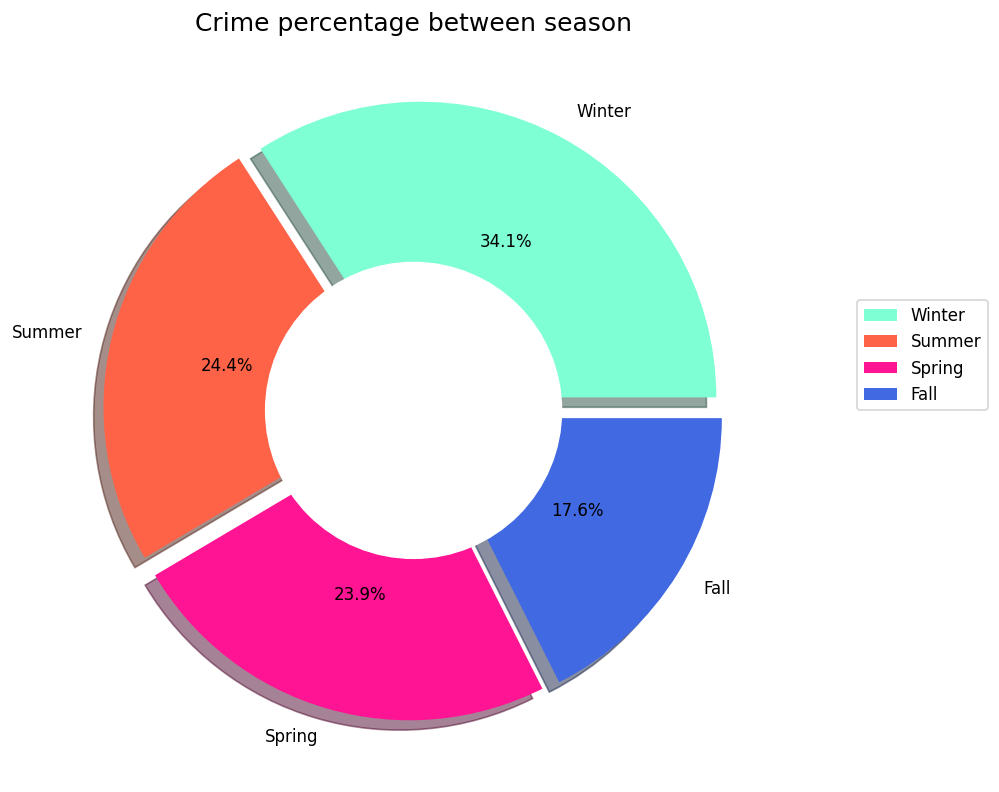

In [60]:
plt.figure(figsize=(12,8),dpi=120)
size=df['season'].value_counts()
color='aquamarine','tomato','deeppink','royalblue'
labels='Winter','Summer','Spring','Fall'
explode=[0.05,0.05,0.05,0.05,]
plt.pie(size,colors=color,labels=labels,explode=explode,autopct='%.1f%%',shadow=True)
# add a circle at the center to transform it in a donut chart
my_circle=plt.Circle( (0,0), 0.5, color='white')
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.legend(loc=(1.1,0.5))
plt.title('Crime percentage between season',fontsize=15,color='black')

Segmenting the crime frequency across seasons over the specified period, a donut chart, reveals that winter has the highest percentage of crimes, followed by summer. In contrast, fall exhibits the lowest incidence of crime.

Text(0, 0.5, 'Count of crime')

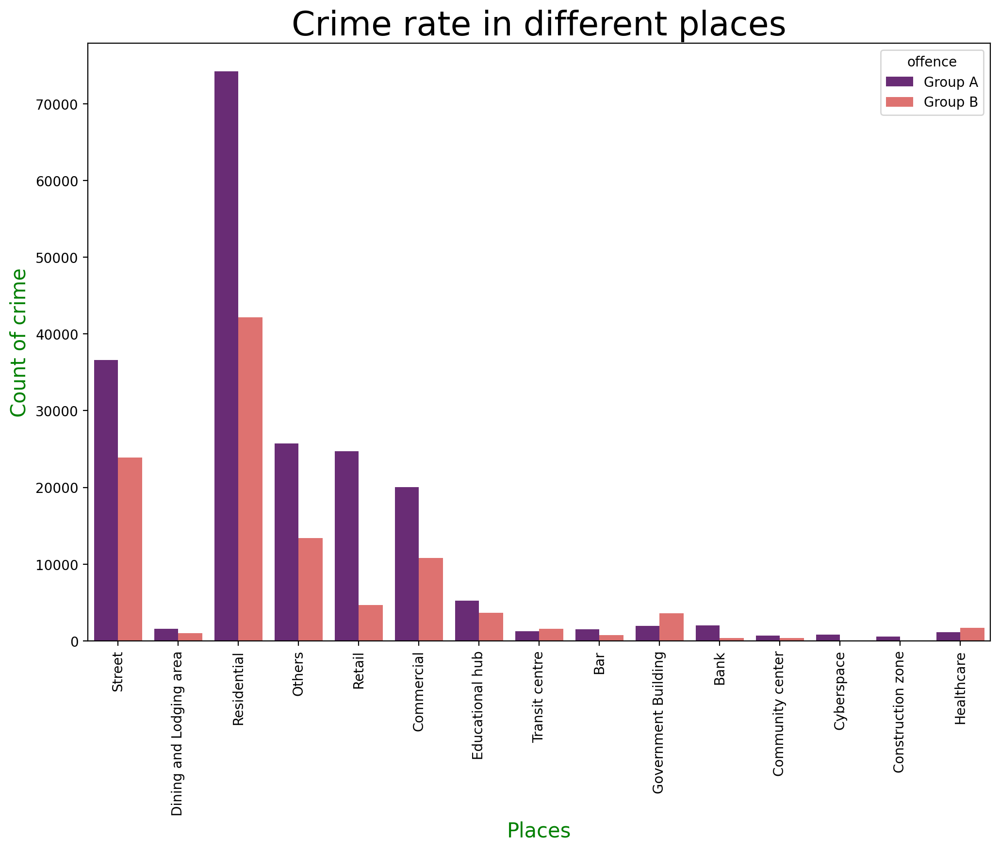

In [81]:
plt.figure(figsize=(12,8),dpi=200)
plt.xticks(rotation=90)
sns.countplot(x='Place_Category',hue='offence', data=df2, palette='magma')
plt.title('Crime rate in different places',fontsize=25,color='black')
plt.xlabel('Places',fontsize=15,color='green')
plt.ylabel('Count of crime',fontsize=15,color='green')

It is evident that the incidence of crimes in residential areas is relatively high for both offenses. Additionally, areas such as streets, retail spaces, commercial zones, and others also show notable levels of criminal activity. Furthermore, across all locations, Group A offenses consistently outnumber Group B offenses.

<Figure size 1800x960 with 0 Axes>

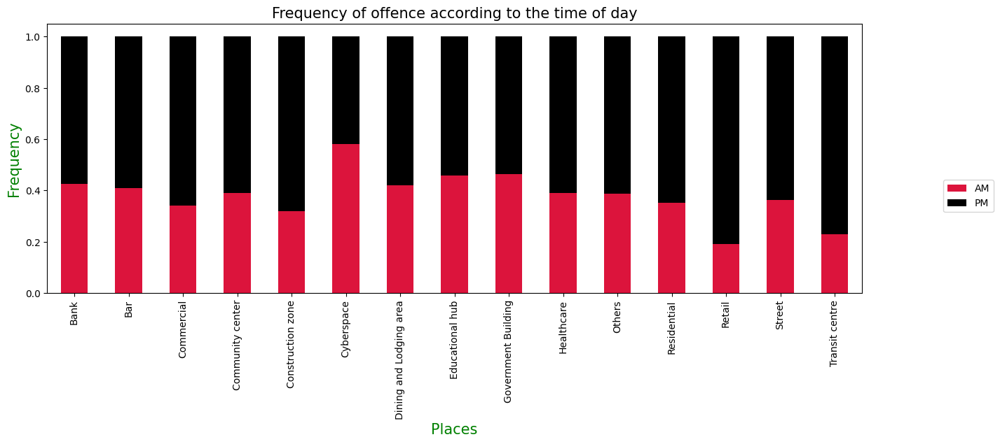

In [64]:
x4=df2['Place_Category'].value_counts().index
d4=df2[df2['Place_Category'].isin(x4)]

plt.figure(figsize=(15,8),dpi=120)
x = pd.crosstab(df2["Place_Category"],df2["AM/PM"])
x.div(x.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 5),color=('crimson','black'))
plt.xticks(rotation=90)
plt.legend(loc=(1.1,0.3))
plt.title('Frequency of offence according to the time of day',fontsize=15,color='black')
plt.xlabel('Places',fontsize=15,color='green')
plt.ylabel('Frequency',fontsize=15,color='green')
plt.show()

Visualizing crimes occurring in various locations throughout the day can be achieved by utilizing a crosstab. Observing the image, it becomes apparent that crimes are more prevalent during nighttime in the categorized areas as opposed to daytime. Consequently, a recommendation is made to enhance security measures during the PM hours.

##**Conclusion**

Recommendations for the local government include prioritizing security measures in Silverspring, particularly within residential areas where crime is more prevalent. Attention should be focused on addressing crimes against property, given their prominence and various contributing factors. Moreover, a higher incidence of crimes is observed during the winter season, with a notable concentration after mid-day across all seasons.

In summary, the crime rate in Montgomery County has shown a decreasing trend in recent years. Implementing the recommendations can contribute to further reducing crime rates in the upcoming years.
